# **Temperature Streaming Prediction from Air Quality Data**🌡️📈


- Alejandro Dopico Castro ([alejandro.dopico2@udc.es](mailto:alejandro.dopico2@udc.es)).
- Abel Juncal Suárez ([abel.juncal@udc.es](mailto:abel.juncal@udc.es)).
- Francesco Maria Mosca ([francesco.maria.mosca@udc.es](mailto:francesco.maria.mosca@udc.es)).
- Ana Xiangning Pereira Ezquerro ([ana.ezquerro@udc.es](mailto:ana.ezquerro@udc.es)).


In [25]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import pandas as pd 
import numpy as np 
from datetime import datetime
from typing import Tuple, List, Union, Tuple, Dict, Optional, Callable
from itertools import product
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

from river.drift import KSWIN, PageHinkley
from river.tree import HoeffdingAdaptiveTreeRegressor
from river.evaluate import progressive_val_score
from river.stream import iter_csv
from river.metrics import MAE
from river.model_selection import SuccessiveHalvingRegressor
from river.ensemble import BaggingRegressor
from river.forest import OXTRegressor, ARFRegressor
from river.tree import HoeffdingTreeRegressor
from sklearn.metrics import mean_absolute_error

from sklearn.pipeline import Pipeline as sk_Pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler as sk_StandardScaler
from sklearn.feature_selection import SelectKBest
from sklearn.tree import DecisionTreeRegressor
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor


from stream import * 
from batch import * 

## **Stream database**

We selected our stream database from the open repository [UCI Machine Learning Repository - Air Quality](https://archive.ics.uci.edu/dataset/360/air+quality). It consists of ~9.3k instances of hourly averaged responses from 5 metal oxide chemical sensors in a polluted area located in Italia from March 2004 to February 2005. Our database has null recordings (labeled with value -200). The **objective** of the project is modeling the temperature based on air quality sensors.

In [26]:
df = pd.read_csv('air.csv')
df

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19:00:00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20:00:00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21:00:00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22:00:00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,04/04/2005,10:00:00,3.1,1314.0,-200.0,13.5,1101.0,472.0,539.0,190.0,1374.0,1729.0,21.9,29.3,0.7568
9353,04/04/2005,11:00:00,2.4,1163.0,-200.0,11.4,1027.0,353.0,604.0,179.0,1264.0,1269.0,24.3,23.7,0.7119
9354,04/04/2005,12:00:00,2.4,1142.0,-200.0,12.4,1063.0,293.0,603.0,175.0,1241.0,1092.0,26.9,18.3,0.6406
9355,04/04/2005,13:00:00,2.1,1003.0,-200.0,9.5,961.0,235.0,702.0,156.0,1041.0,770.0,28.3,13.5,0.5139


## **Exploratory Data Analysis**


The raw database needs a previous preprocessing step to remove non-relevant columns or adapting their format to make them suitable as input feature to a ML model.

- **Date**: The raw date should not be included as input feature, but to order our static dataset and create a data stream. We split the data into the **Season**, encoded with an integer from $0$ (winter) to $3$ (fall), and **Month** of the sample.
- **Time**: It uses the 24 hours format. We decided to normalize it using the sine and cosine functions, thus replacing the **Time** variable with two new variable: (i) **sin(time)** and (ii) **cos(time)**, defined as (i) $\sin(\pi\cdot\text{time}/12)$ and (ii) $\cos(\pi\cdot\text{time}/12)$.

In [27]:
df['Month'] = df.Date.map(lambda x: int(x.split('/')[1]))
df['Season'] = (df.Month % 12)//3
df['Time'] = df.Time.map(lambda x: x.split(':')[0]).astype(int)/12*np.pi
df['cos(t)'] = df.Time.map(np.cos)
df['sin(t)'] = df.Time.map(np.sin)
df = df.drop(['Date', 'Time'], axis=1)
df

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Month,Season,cos(t),sin(t)
0,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,3,1,-1.836970e-16,-1.000000e+00
1,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,3,1,2.588190e-01,-9.659258e-01
2,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,3,1,5.000000e-01,-8.660254e-01
3,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,3,1,7.071068e-01,-7.071068e-01
4,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,3,1,8.660254e-01,-5.000000e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,3.1,1314.0,-200.0,13.5,1101.0,472.0,539.0,190.0,1374.0,1729.0,21.9,29.3,0.7568,4,1,-8.660254e-01,5.000000e-01
9353,2.4,1163.0,-200.0,11.4,1027.0,353.0,604.0,179.0,1264.0,1269.0,24.3,23.7,0.7119,4,1,-9.659258e-01,2.588190e-01
9354,2.4,1142.0,-200.0,12.4,1063.0,293.0,603.0,175.0,1241.0,1092.0,26.9,18.3,0.6406,4,1,-1.000000e+00,1.224647e-16
9355,2.1,1003.0,-200.0,9.5,961.0,235.0,702.0,156.0,1041.0,770.0,28.3,13.5,0.5139,4,1,-9.659258e-01,-2.588190e-01


The next cell shows the histogram of each input raw variable. Comments to be considered are:

1. The data is evenly distributed across time. Although we have more samples for March (the third month), no month is underrepresented in our database. 
2. For all continuous variables we see the impact of having the null values labeled as -200. Since all the features are sensor measures (and hence cannot be negative), we should treat this value as missing data.


In [28]:
n_cols = 4
n_rows = int(np.ceil(len(df.columns)/n_cols))
fig = make_subplots(rows=n_rows, cols=n_cols, subplot_titles=df.columns)
for i, col in enumerate(df.columns):
    x = df[col].values 
    fig.add_trace(go.Histogram(x=x, showlegend=False), row=i//n_cols+1, col=i%n_cols+1)
fig.update_layout(height=n_rows*200, width=n_cols*300, template='seaborn', 
                                    margin=dict(t=60, b=20, l=20, r=20),
                  title_text='Univariate histograms with null values')
fig.show()


See the histogram difference when removing null values:

In [29]:
n_cols = 4
n_rows = int(np.ceil(len(df.columns)/n_cols))
fig = make_subplots(rows=n_rows, cols=n_cols, subplot_titles=df.columns)
for i, col in enumerate(df.columns):
    x = df[col].values 
    fig.add_trace(go.Histogram(x=x[x != -200], showlegend=False), row=i//n_cols+1, col=i%n_cols+1)
    
fig.update_layout(height=n_rows*200, width=n_cols*300, template='seaborn', 
                                    margin=dict(t=60, b=20, l=20, r=20),
                  title_text='Univariate histograms without null values')
fig.show()


We now display the time series of all variables to detect some anomaly in the input features distributed across time. 

In [30]:
import numpy as np 
n_cols = 4
features = df.columns.drop(['T', 'Month', 'Season', 'cos(t)', 'sin(t)'])
n_rows = int(np.ceil(len(features)/n_cols))
fig = make_subplots(rows=n_rows, cols=n_cols, subplot_titles=features)
for i, col in enumerate(features):
    x = df[col].values 
    fig.add_trace(go.Scatter(y=x[x != -200], showlegend=False), row=i//n_cols+1, col=i%n_cols+1)
fig.update_layout(height=n_rows*200, width=n_cols*300, template='seaborn', 
                  margin=dict(t=60, b=20, l=20, r=20),
                  title_text='Feature time series')
fig.show()
fig.write_image('features.svg')

**Data Preprocessing**: To train our ML models, the continuous variables (**CO(GT)**, **PT08.S1(CO)**, **NMHC(GT)**, **C6H6(GT)**, **PT08.S2(NMHC)**, **NOx(GT)**, **PT08.S3(NOx)**, **NO2(GT)**, **PT08.S4(NO2)**, **PT08.S5(O3)**, **T**, **RH**, **AH**) will be standardized with zero-mean and we will impute the null values (labeled as -200) with the fist non-null previous value.

**Target variable**: The target variable is the temperature **T**, and, since it is inherently continuous, our task is a regression problem where we want to model the temperature variation. Note that this variable is subject of day seasonality (naturally it will give higher values during daylight hours than during night). In fact, the seasonality can be detected with a simple additive decomposition:

In [31]:
def sequential_imputation(x: np.ndarray, detect: Callable = (lambda x: x == -200)) -> np.ndarray:
    r"""Performs de sequential imputation for an input feature.
    
    Args:
        x (np.ndarray): Input features.
        detect (Callable): Function to detect null values.
        
    Returns:
        Imputed feature.
    """
    x = np.array(x)
    last = x[~detect(x)][0]
    for i, item in enumerate(x):
        if detect(item):
            x[i] = last 
        last = x[i]
    return x


df = pd.read_csv('air.csv')
dates = list(map(lambda x: datetime.strptime(' '.join(x), '%d/%m/%Y  %H:%M:%S'), df[['Date', 'Time']].values))
target = sequential_imputation(df['T'].values[:24*7*3])

result = seasonal_decompose(target, model='additive', period=24)
fig = make_subplots(rows=2, cols=2)
fig.add_trace(go.Scatter(x=dates, y=target, name='temperature'), row=1, col=1)
fig.add_trace(go.Scatter(x=dates, y=result.trend, name='trend'), row=2, col=1)
fig.add_trace(go.Scatter(x=dates, y=result.seasonal, name='seasonal'), row=1, col=2)
fig.add_trace(go.Scatter(x=dates, y=result.resid, name='residuals'), row=2, col=2)

fig.update_layout(width=800*2, height=600, title_text='Additive decomposition of temperature', template='seaborn',
                  margin=dict(t=60, b=20, l=20, r=20),
)
fig.show()
fig.write_image('decomposition.svg')

## **Concept drift**

Our database will be probably subject of concept drift. The target variable (temperature) considerably changes over the observation period (accordingly to the temperature seasons of the year), whereas some of the other variables (such as `C6H6(GT)` or `PT08.S5`) do not seem to experience these changes, although others do (such as `AH`). 

The next cells run two different concept drift detectors: [Kolmogorov-Smirnov Windowing](https://riverml.xyz/0.14.0/api/drift/KSWIN/) and [Page-Hinkley](https://riverml.xyz/0.14.0/api/drift/PageHinkley/) for the target variable `T`, and finally displays in the scatter plot the samples detected with high variation.

In [32]:
fig = go.Figure()
target = sequential_imputation(df['T'].values)
fig.add_trace(go.Scatter(y=target, showlegend=False))

kswin = KSWIN(alpha=1e-8)
ph = PageHinkley(threshold=200)
for i, sample in enumerate(target):
    kswin.update(sample)
    ph.update(sample)
    if kswin.drift_detected:
        fig.add_vline(x=i, line_color='green', opacity=0.5)
    if ph.drift_detected:
        fig.add_vline(x=i, line_color='red', opacity=0.5)


fig.update_layout(width=1200, height=600, title_text='Concept drift detected in the temperature', margin=dict(t=60, b=20, l=20, r=20))
fig.show()
fig.write_image('drift.svg')

## **Batch Learning**

For the Batch Learning approaches, we first split the train and test set using 15% of the last recorded samples as our real deployment data. 

In [33]:
df = pd.read_csv('air.csv').drop(["Date", "Time"], axis = 1)
batch_targets = df.pop("T")

len_train_set = int(len(batch_targets) * 0.75)
X_train, X_test = df[:len_train_set], df[len_train_set:]
y_train, y_test = batch_targets[:len_train_set], batch_targets[len_train_set:]

The script [batch.py](batch.py) includes the implemented functions to create the preprocessing pipeline. For Batch Learning approaches, our pipeline consists of:

1. [Optional, `impute`]: Sequential imputate -200 labels. By default, it does not impute since, unlike stream learning, we detected that batch learning methods reach a better performance without imputation. 
2. Select the top $K=10$ features to train.

For this paradigm, we tested the Linear Regression model ([`LinearRegression`](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html)), SVR ([`SVR`](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html)), Decision Tree ([`DecisionTreeRegressor`](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html)) and te Random Forest ([`RandomForestRegressor`](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html)). We performed an hyperparameter search for each baseline to obtain the top-performing configuration.


In [34]:
models = [
    ('linealRegression', LinearRegression()),
    ('svr', SVR()),
    ('decision_tree', DecisionTreeRegressor(random_state=42)),
    ('random_forest', RandomForestRegressor(random_state=42)),
]
param_grid = [
    {'model__fit_intercept': [True, False]},
    {'model__C': [0.1, 1, 10], 'model__kernel': ['linear', 'rbf']},
    {'model__max_depth': [None, 10, 20, 30]},
    {'model__n_estimators': [10, 50, 100], 'model__max_depth': [None, 10, 20], 'selector__k': ["all", 5, 8]}
]

best_models = []
for (name, model), params in zip(models, param_grid):
    print(name, model, params)
    batch_pipeline = create_pipeline(model)
    batch_pipeline_imputation = create_pipeline(model, impute=True)
    grid_search = GridSearchCV(batch_pipeline, params, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    grid_search_imputation = GridSearchCV(batch_pipeline_imputation, params, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)
    grid_search_imputation.fit(X_train, y_train)
    best_models.append((name, grid_search.best_estimator_))
    best_models.append((name +  "_imputation", grid_search_imputation.best_estimator_))

linealRegression LinearRegression() {'model__fit_intercept': [True, False]}


svr SVR() {'model__C': [0.1, 1, 10], 'model__kernel': ['linear', 'rbf']}
decision_tree DecisionTreeRegressor(random_state=42) {'model__max_depth': [None, 10, 20, 30]}
random_forest RandomForestRegressor(random_state=42) {'model__n_estimators': [10, 50, 100], 'model__max_depth': [None, 10, 20], 'selector__k': ['all', 5, 8]}


In [35]:
metrics = []
for (name, best_model) in best_models:
    print(f"Model {name} with params {best_model}:")
    best_model.fit(X_train, y_train)
    y_pred = best_model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    metrics.append((name, mae))
    print(f"Mean Absolute Error (MAE): {mae}")

Model linealRegression with params Pipeline(steps=[('selector', SelectKBest()), ('scaler', StandardScaler()),
                ('model', LinearRegression())]):
Mean Absolute Error (MAE): 4.003223110440204
Model linealRegression_imputation with params Pipeline(steps=[('selector', SelectKBest()), ('scaler', StandardScaler()),
                ('model', LinearRegression())]):
Mean Absolute Error (MAE): 4.003223110440204
Model svr with params Pipeline(steps=[('selector', SelectKBest()), ('scaler', StandardScaler()),
                ('model', SVR(C=10))]):
Mean Absolute Error (MAE): 2.431519457135545
Model svr_imputation with params Pipeline(steps=[('selector', SelectKBest()), ('scaler', StandardScaler()),
                ('model', SVR(C=10))]):
Mean Absolute Error (MAE): 2.431519457135545
Model decision_tree with params Pipeline(steps=[('selector', SelectKBest()), ('scaler', StandardScaler()),
                ('model',
                 DecisionTreeRegressor(max_depth=20, random_state=42))]):

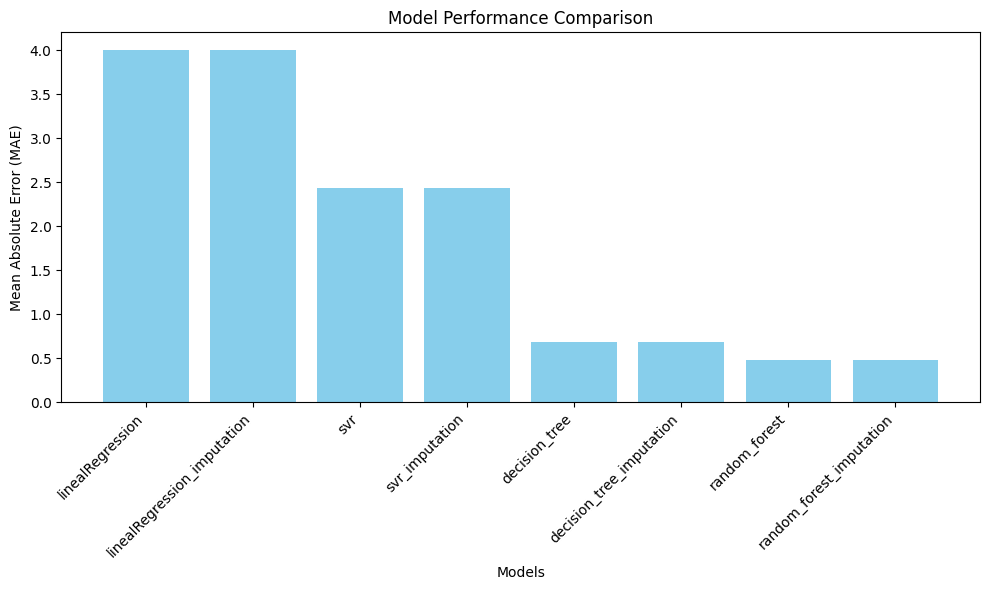

In [36]:
models_name = [name for name, _ in metrics]
mae_values = [value for _, value in metrics]
plot_model_performance(models_name, mae_values)

<Axes: >

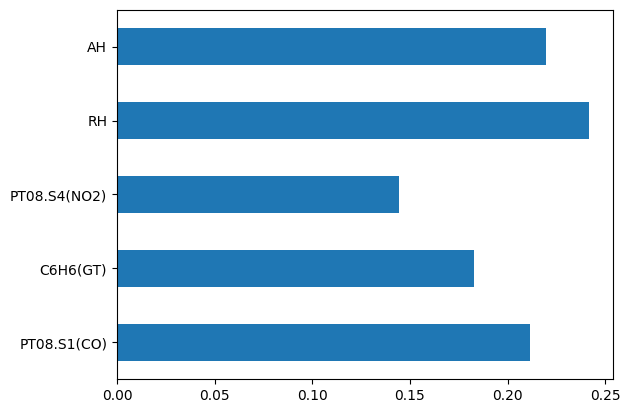

In [37]:
selected_features = best_model["selector"].get_feature_names_out()
pd.Series(best_models[-1][1]["model"].feature_importances_, index=selected_features).plot(kind='barh')

In [38]:
inputs = pd.concat([X_train, X_test])
batch_preds = {name: model.predict(inputs) for name, model in best_models if 'imputation' not in name}


## **Stream Learning**

### Preprocessing Pipeline 

Our preprocessing pipeline for the Stream Learning methods is included in the script [stream.py](stream.py) in the function `add_preprocess()`. Note that this function accepts as input: 

- `model`: A River model that, in purpose, should be a regressor model.
- `use_time`: Boolean value indicating whether time features must be included.
- `impute`: Boolean value indicating whether the sequential imputation is applied **before** normalization.

The full preprocessing Pipeline filters a given sample to the following steps:

1. [Optional, `use_time`]: Extract the month, season and sine/cosine of the hour.
2. Discard features `Time` and `Date`.
3. [Optional, `impute`]: Sequential imputation.
4. Zero-mean normalization.

See below an example of how the pipeline is built from a regression model.

In [40]:
cols = pd.read_csv('air.csv').columns
stream_data = lambda: iter_csv('air.csv', target='T', converters={col: cast_float for col in cols})

tree = HoeffdingAdaptiveTreeRegressor(grace_period=40, min_samples_split=50)
pipe = add_preprocess(tree)
progressive_val_score(stream_data(), pipe, MAE())

MAE: 10.16556

### Model selection 

We conducted an extensive hyperparameter and model search to find the optimal configuration on our evaluation metric. We primarily focused on tree-based approaches. From our first experiments, we discarded neural networks, linear regression and kNN methods due to their inferior performance compared to tree-based and ensemble approaches.

The next cell code shows an example of our model search with the inner River function [SuccessiveHalvingRegressor](https://riverml.xyz/0.11.0/api/model-selection/SuccessiveHalvingRegressor/). This function takes as input a set of regressors and incrementally removes the subset with the worst performance, thus avoiding the need to train all regressors simultaneously.

In [41]:
# hyperparameter search for BaggingRegressor
hoef_params = ['grace_period', 'tau', 'leaf_prediction', 'min_samples_split']
hoef_grid = [[10, 50, 200], [0.5, 0.1], ['mean', 'model', 'adaptive'], [20, 50, 100]]

bags = [BaggingRegressor(model=HoeffdingTreeRegressor(**dict(zip(hoef_params, values))), seed=1) 
        for values in product(*hoef_grid)]
bags = list(map(add_preprocess, bags))
bag = SuccessiveHalvingRegressor(bags, metric=MAE(), budget=500*len(bags), eta=2, verbose=True)
progressive_val_score(stream_data(), model=bag, metric=MAE())
bag.best_model.steps

[1]	27 removed	27 left	83 iterations	budget used: 4482	budget left: 22518	best MAE: 2.597884
[2]	13 removed	14 left	166 iterations	budget used: 8964	budget left: 18036	best MAE: 2.982108
[3]	7 removed	7 left	321 iterations	budget used: 13458	budget left: 13542	best MAE: 2.127553
[4]	3 removed	4 left	642 iterations	budget used: 17952	budget left: 9048	best MAE: 2.534574
[5]	2 removed	2 left	1125 iterations	budget used: 22452	budget left: 4548	best MAE: 6.30883
[6]	1 removed	1 left	2250 iterations	budget used: 26952	budget left: 48	best MAE: 5.090932


OrderedDict([('get_date_features',
              FuncTransformer (
                func="get_date_features"
              )),
             ('Discard',
              Discard (
                Date
                Time
              )),
             ('SequentialImputer',
              FuncTransformer (
                func=<stream.SequentialImputer object at 0x0000022BC1EB5C60>
              )),
             ('StandardScaler',
              StandardScaler (
                with_std=True
              )),
             ('TargetTransformRegressor',
              TargetTransformRegressor (
                regressor=BaggingRegressor (
                  model=HoeffdingTreeRegressor (
                    grace_period=10
                    max_depth=inf
                    delta=1e-07
                    tau=0.1
                    leaf_prediction="adaptive"
                    leaf_model=LinearRegression (
                      optimizer=SGD (
                        lr=Constant (
            

To compare three different stream approaches, we selected (i) the `BaggingRegressor` with the `HoeffdingTreeRegressor` as base estimator, (ii) the `OXTRegressor` and (iii) `ARFRegressor`.

The `HoeffdingTreeRegressor` is an adaptation of the incremental tree algorithm with the Hoeffding bound criteria to split decision nodes minimizing the variance in the leaf nodes. For this base estimator we fixed the hyperparameter `max_depth` to `None`, allowing the tree to grow indefinitely as long as it learns from data, and experimented with `grace_period`, `tau`, `leaf_prediction` and `min_samples_split`. We fixed the number of estimators to `100` for all ensemble models to make them comparable.

The `ARFRegressor` is the Adaptive Random Foest regressors that includes diversity through feature resampling in node splits and drift detectors per base tree, reseting models in case of concept drift detection. For this approach, we fixed the number of models to `100` again, the `max_features` to `None` (to use all attributes for each node split) and enable de weighted vote (`disable_weighted_vote` to `False`), so the trees' predictions are weighted depending on their performance. We experimented with other parameters such as `aggregation_method`, `grace_period`, `lambda_value` and `min_samples_split`.

The `OXTRegressor` (Online Extra Trees) enriches the randomization process with respect to Adaptative Random Forests at each node split (a subset of features is always considered). We fixed again the number of estimators to `100`, the maximum depth to `None` and enabled the weighted prediction, and experimented with the `detection_mode` parameter, the `grace_period` and the `min_samples_split`.

In [42]:
# hyperparameter search for ARFRegressor
arf_params = ['aggregation_method', 'grace_period', 'lambda_value', 'min_samples_split']
arf_grid = [['median', 'mean'], [10, 50, 200], [2, 5, 7],  [20, 50, 100]]
arfs = [ARFRegressor(n_models=100, max_features=None, disable_weighted_vote=False, seed=1,
                     **dict(zip(arf_params, values))) for values in product(*arf_grid)]
arfs = list(map(add_preprocess, arfs))
arf = SuccessiveHalvingRegressor(arfs, metric=MAE(), budget=500*len(arfs), eta=2, verbose=True)
progressive_val_score(stream_data(), model=arf, metric=MAE())
arf.best_model.steps

[1]	27 removed	27 left	83 iterations	budget used: 4482	budget left: 22518	best MAE: 2.313521
[2]	13 removed	14 left	166 iterations	budget used: 8964	budget left: 18036	best MAE: 2.79178
[3]	7 removed	7 left	321 iterations	budget used: 13458	budget left: 13542	best MAE: 2.044925
[4]	3 removed	4 left	642 iterations	budget used: 17952	budget left: 9048	best MAE: 2.477869
[5]	2 removed	2 left	1125 iterations	budget used: 22452	budget left: 4548	best MAE: 6.313052
[6]	1 removed	1 left	2250 iterations	budget used: 26952	budget left: 48	best MAE: 5.188324


OrderedDict([('get_date_features',
              FuncTransformer (
                func="get_date_features"
              )),
             ('Discard',
              Discard (
                Date
                Time
              )),
             ('SequentialImputer',
              FuncTransformer (
                func=<stream.SequentialImputer object at 0x0000022C04CAE380>
              )),
             ('StandardScaler',
              StandardScaler (
                with_std=True
              )),
             ('TargetTransformRegressor',
              TargetTransformRegressor (
                regressor=ARFRegressor (
                  n_models=100
                  max_features=16
                  aggregation_method="median"
                  lambda_value=2
                  metric=MSE ()
                  disable_weighted_vote=False
                  drift_detector=ADWIN (
                    delta=0.001
                    clock=32
                    max_buckets=5
          

In [43]:
# hypterparmeter search of OXTRegressor
oxt_params = ['detection_mode', 'grace_period', 'min_samples_split']
oxt_grid = [['all', 'drop', 'off'], [10, 50, 200],  [20, 50, 100]]
oxts = [OXTRegressor(n_models=100, max_features=None, disable_weighted_vote=False, seed=1,
                        **dict(zip(oxt_params, values))) for values in product(*oxt_grid)]
oxts = list(map(add_preprocess, oxts))
oxt = SuccessiveHalvingRegressor(oxts, metric=MAE(), budget=500*len(oxts), eta=2, verbose=True)
progressive_val_score(stream_data(), model=oxt, metric=MAE())
oxt.best_model.steps

[1]	13 removed	14 left	100 iterations	budget used: 2700	budget left: 10800	best MAE: 3.486001
[2]	7 removed	7 left	192 iterations	budget used: 5388	budget left: 8112	best MAE: 3.760251
[3]	3 removed	4 left	385 iterations	budget used: 8083	budget left: 5417	best MAE: 2.420229
[4]	2 removed	2 left	675 iterations	budget used: 10783	budget left: 2717	best MAE: 2.692249
[5]	1 removed	1 left	1350 iterations	budget used: 13483	budget left: 17	best MAE: 5.508506


OrderedDict([('get_date_features',
              FuncTransformer (
                func="get_date_features"
              )),
             ('Discard',
              Discard (
                Date
                Time
              )),
             ('SequentialImputer',
              FuncTransformer (
                func=<stream.SequentialImputer object at 0x0000022C595A4F70>
              )),
             ('StandardScaler',
              StandardScaler (
                with_std=True
              )),
             ('TargetTransformRegressor',
              TargetTransformRegressor (
                regressor=OXTRegressor (
                  n_models=100
                  max_features=None
                  resampling_strategy="subbagging"
                  resampling_rate=0.5
                  detection_mode="off"
                  warning_detector=ADWIN (
                    delta=0.01
                    clock=32
                    max_buckets=5
                    min_window_lengt

## **Comparison between approaches**

The next cell shows how the best configuration of each selected regressor (`BaggingRegressor`, `ARFRegressor`, `OXTRegressor`) fits the target time series, with the MAE associated. 

In [44]:
models = {'BaggingRegressor': bag.best_model, 'ARFRegressor': arf.best_model, 'OXTRegressor': oxt.best_model}
preds = train(stream_data(), models)
metrics = {name: mean_absolute_error(target, pred) for name, pred in preds.items()}
plot_preds(preds, target, metrics)

In [103]:
fig = go.Figure()

nonimputed = pd.read_csv('air.csv')['T'].values
imputed = target

for name, pred in batch_preds.items():
    mae = mean_absolute_error(nonimputed, pred)
    x = [name for _ in pred]
    fig.add_trace(go.Box(x=x, y=abs(nonimputed-pred), name=f'{name} ({mae:.2f})'))
for name, pred in preds.items():
    mae = mean_absolute_error(imputed, pred)
    x = [name for _ in pred]
    fig.add_trace(go.Box(x=x, y=abs(imputed-pred),  name=f'{name} ({mae:.2f})'))
    
fig.update_layout(width=1200, height=700, title_text='Absolute error distribution', 
                  template='seaborn', margin=dict(t=60, b=20, l=20, r=20), yaxis=dict(range=(-1, 25)),
                  # title=dict(font=dict(size=26)),
                  # legend=dict(yanchor='bottom', y=0, xanchor='left', x=1, font=dict(size=20))
                  )
fig.show()
fig.write_image('figures/boxes.svg')

## **Conclusions**